<a href="https://colab.research.google.com/github/MayerT1/LiDAR_Dev/blob/main/Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install rasterio geopandas pandas torch torchvision scikit-learn einops

In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
import os
import folium
import rasterio
from rasterio.warp import transform_bounds
from glob import glob
from shapely.geometry import box, Point, mapping
import geopandas as gpd
import pandas as pd

# ----------------- CONFIG -----------------
RASTER_DIR = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
GEDI_CSV = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/GEDI_filtered_merged.csv'

COVARIATE_COLORS = {
    'dem': 'gray',
    'ls': 'green',
    'ndvi': 'purple',
    'savi': 'blue',
    'evi': 'orange',
    'slope': 'red',
    'aspect': 'brown',
    'elevation': 'black',
    'default': 'pink'
}

# ----------------- Load GEDI Targets -----------------
gedi_df = pd.read_csv(GEDI_CSV)

lat_col_candidates = ['latitude', 'lat', 'y']
lon_col_candidates = ['longitude', 'lon', 'x']

lat_col = next((col for col in lat_col_candidates if col in gedi_df.columns), None)
lon_col = next((col for col in lon_col_candidates if col in gedi_df.columns), None)

if not lat_col or not lon_col:
    raise ValueError(f"Latitude/Longitude columns not found. Expected one of {lat_col_candidates} and {lon_col_candidates}")

gedi_gdf = gpd.GeoDataFrame(
    gedi_df,
    geometry=gpd.points_from_xy(gedi_df[lon_col], gedi_df[lat_col]),
    crs='EPSG:4326'
)

# Create square buffer (~25m = ~0.000225 degrees at equator)
gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")

# ----------------- Load Raster Bounds -----------------
tif_files = glob(os.path.join(RASTER_DIR, '**/*.tif'), recursive=True)

raster_records = []
for tif in tif_files:
    try:
        with rasterio.open(tif) as src:
            bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
            cov = next((c for c in COVARIATE_COLORS if c in tif.lower()), 'default')
            color = COVARIATE_COLORS[cov]
            geom = box(*bounds)
            block_id = os.path.basename(tif).split('_')[-1].replace('.tif', '')
            raster_records.append({
                'geometry': geom,
                'block_id': block_id,
                'covariate': cov,
                'resolution': src.res[0],
                'color': color,
                'filename': os.path.basename(tif)
            })
    except Exception as e:
        print(f"[WARN] Skipping {tif}: {e}")

raster_gdf = gpd.GeoDataFrame(raster_records, crs='EPSG:4326')

#----------------- Initialize Map -----------------
center = gedi_gdf.geometry.unary_union.centroid
m = folium.Map(location=[center.y, center.x], zoom_start=13, tiles="CartoDB positron")

# ----------------- Add GEDI Layer -----------------
for _, row in gedi_gdf.iterrows():
    coords = list(mapping(row.geometry)['coordinates'][0])
    folium.Polygon(
        locations=[(lat, lon) for lon, lat in coords],
        color='cyan',
        fill=True,
        fill_opacity=0.4,
        tooltip=f"<b>GEDI</b><br>Block: {row['block_id']}"
    ).add_to(m)

# ----------------- Add Raster Layers (Grouped by Covariate) -----------------
for covariate in raster_gdf['covariate'].unique():
    sub_gdf = raster_gdf[raster_gdf['covariate'] == covariate]
    for _, row in sub_gdf.iterrows():
        coords = list(mapping(row.geometry)['coordinates'][0])
        folium.Polygon(
            locations=[(lat, lon) for lon, lat in coords],
            color=row['color'],
            weight=1,
            fill=True,
            fill_opacity=0.2,
            tooltip=f"""
                <b>{covariate.upper()}</b><br>
                Block ID: {row['block_id']}<br>
                Resolution: {row['resolution']}<br>
                File: {row['filename']}
            """
        ).add_to(m)

# ----------------- Show Map -----------------
m


/tmp/ipython-input-5-559494082.py:45: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
/tmp/ipython-input-5-559494082.py:46: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")
/tmp/ipython-input-5-559494082.py:74: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center = gedi_gdf.geometry.unary_union.centroid


In [6]:
raster_gdf

,geometry,block_id,covariate,resolution,color,filename
0,"POLYGON ((-85.8567 35.19413, -85.8567 35.19714...",3519,ls,30.0,green,hls_train_-8586_3519.tif
1,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,ls,30.0,green,hls_train_-8586_3523.tif
2,"POLYGON ((-85.86257 35.12683, -85.86257 35.130...",3512,ls,30.0,green,hls_train_-8587_3512.tif
3,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,ls,30.0,green,hls_train_-8586_3522.tif
4,"POLYGON ((-85.86333 35.14361, -85.86333 35.146...",3514,ls,30.0,green,hls_train_-8587_3514.tif
...,...,...,...,...,...,...
1337,"POLYGON ((-85.97295 35.17353, -85.97295 35.176...",3517,dem,30.0,gray,dem_test_-8598_3517.tif
1338,"POLYGON ((-85.85651 35.18385, -85.85651 35.186...",3518,ls,30.0,green,hls_train_-8586_3518.tif
1339,"POLYGON ((-85.85697 35.17438, -85.85697 35.177...",3517,ls,30.0,green,hls_train_-8586_3517.tif
1340,"POLYGON ((-85.85691 35.20197, -85.85691 35.205...",3520,ls,30.0,green,hls_train_-8586_3520.tif


Average GEDI values per 32x32 block

In [7]:
# ----------------- Ensure Same CRS -----------------
gedi_gdf = gedi_gdf.to_crs('EPSG:4326')
raster_gdf = raster_gdf.to_crs('EPSG:4326')

# ----------------- Spatial Join -----------------
# Each GEDI point gets linked to overlapping raster tile
joined = gpd.sjoin(gedi_gdf, raster_gdf, how='inner', predicate='intersects')

# ----------------- Compute Per-Tile Averages -----------------
target_cols = ['pai', 'fhd_normal', 'rh100']

# Check original target columns exist
for col in target_cols:
    if col not in joined.columns:
        raise ValueError(f"Missing required column '{col}' in joined GeoDataFrame")

# Group by raster polygon index and compute averages
avg_df = (
    joined
    .groupby('index_right')[target_cols]
    .mean()
    .rename(columns={
        'pai': 'avg_pai',
        'fhd_normal': 'avg_fhd_normal',
        'rh100': 'avg_rh100'
    })
    .reset_index()
)

# ----------------- Merge Averages with Raster Polygons -----------------
# Reset index to get 'index_right' for joining
raster_meta = raster_gdf.reset_index().rename(columns={'index': 'index_right'})

# Merge averages onto raster polygons
raster_with_avg = raster_meta.merge(avg_df, on='index_right', how='left')

# ----------------- Finalize Output -----------------
# raster_with_avg is a GeoDataFrame with one polygon per raster tile,
# and averaged GEDI target values per polygon.

# Select relevant columns (add more if needed)
final_cols = [
    'geometry', 'block_id', 'covariate', 'filename', 'resolution',
    'avg_pai', 'avg_fhd_normal', 'avg_rh100'
]

final_df = raster_with_avg[final_cols].copy()

# ----------------- Output -----------------
print("✅ Final raster polygons with averaged GEDI target values:")
print(final_df.head())
print(f"\n✅ Total raster polygons with GEDI data: {len(final_df)}")


✅ Final raster polygons with averaged GEDI target values:
                                            geometry block_id covariate  \
0  POLYGON ((-85.8567 35.19413, -85.8567 35.19714...     3519        ls   
1  POLYGON ((-85.85683 35.23119, -85.85683 35.234...     3523        ls   
2  POLYGON ((-85.86257 35.12683, -85.86257 35.130...     3512        ls   
3  POLYGON ((-85.85662 35.2228, -85.85662 35.2260...     3522        ls   
4  POLYGON ((-85.86333 35.14361, -85.86333 35.146...     3514        ls   

                   filename  resolution   avg_pai  avg_fhd_normal    avg_rh100  
0  hls_train_-8586_3519.tif        30.0  3.609207        3.223214  2811.500000  
1  hls_train_-8586_3523.tif        30.0  1.829600        2.199521  1414.666667  
2  hls_train_-8587_3512.tif        30.0       NaN             NaN          NaN  
3  hls_train_-8586_3522.tif        30.0  2.046263        2.700620  1849.133333  
4  hls_train_-8587_3514.tif        30.0  4.536516        3.179980  2659.500000  

✅ To

In [8]:
for col in final_df.columns:
    print(col)


geometry
block_id
covariate
filename
resolution
avg_pai
avg_fhd_normal
avg_rh100


In [9]:
# final_df

avg_target_df = final_df.dropna()

avg_target_df

,geometry,block_id,covariate,filename,resolution,avg_pai,avg_fhd_normal,avg_rh100
0,"POLYGON ((-85.8567 35.19413, -85.8567 35.19714...",3519,ls,hls_train_-8586_3519.tif,30.0,3.609207,3.223214,2811.500000
1,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,ls,hls_train_-8586_3523.tif,30.0,1.829600,2.199521,1414.666667
3,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,ls,hls_train_-8586_3522.tif,30.0,2.046263,2.700620,1849.133333
4,"POLYGON ((-85.86333 35.14361, -85.86333 35.146...",3514,ls,hls_train_-8587_3514.tif,30.0,4.536516,3.179980,2659.500000
5,"POLYGON ((-85.86287 35.1528, -85.86287 35.1560...",3515,ls,hls_train_-8587_3515.tif,30.0,3.235711,2.857178,2190.555556
...,...,...,...,...,...,...,...,...
1337,"POLYGON ((-85.97295 35.17353, -85.97295 35.176...",3517,dem,dem_test_-8598_3517.tif,30.0,0.220167,1.746972,680.833333
1338,"POLYGON ((-85.85651 35.18385, -85.85651 35.186...",3518,ls,hls_train_-8586_3518.tif,30.0,2.996850,2.973804,2674.384615
1339,"POLYGON ((-85.85697 35.17438, -85.85697 35.177...",3517,ls,hls_train_-8586_3517.tif,30.0,2.222445,2.755105,2205.333333
1340,"POLYGON ((-85.85691 35.20197, -85.85691 35.205...",3520,ls,hls_train_-8586_3520.tif,30.0,3.777873,3.306463,3096.666667


transformer

In [10]:
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

spatial_res = {
    's1': 10, 's2': 20, 's2_idx': 20,
    'landsat': 30, 'landsat_idx': 30, 'hls': 30,
    'tcap': 30, 'dem': 30
}

bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}


In [11]:
# # Number of channels per EO
# eo_channels = {
#     's1': 4,
#     's2': 6,
#     'landsat': 6,
#     'landsat_idx': 7,
#     'hls': 7,
#     'tcap': 6,
#     'dem': 2,
#     's2_idx': 8,
# }

# # Patch embedders (per EO)
# patch_embedders = {
#     eo: PatchEmbedder(in_channels=eo_channels[eo], patch_size=16, embed_dim=64).to(device)
#     for eo in eo_list
# }


# S1 branch

In [12]:
data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'

In [13]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn

# # --- Dataset ---
# class S1Dataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"s1_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_fix_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array = src.read(out_dtype='float32')
#         tensor = torch.from_numpy(array)

#         _, h, w = tensor.shape
#         desired = self.patch_size

#         if h > desired:
#             tensor = tensor[:, :desired, :]
#         if w > desired:
#             tensor = tensor[:, :, :desired]

#         pad_h = max(0, desired - tensor.shape[1])
#         pad_w = max(0, desired - tensor.shape[2])
#         if pad_h > 0 or pad_w > 0:
#             tensor = nn.functional.pad(tensor, (0, pad_w, 0, pad_h), mode='constant', value=0)

#         return tensor

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_fix_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- Minimal ViT for S1 (4 channels input) ---
# class SimpleViT(nn.Module):
#     def __init__(self, in_channels=4, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_size = patch_size
#         self.emb_dim = emb_dim

#         # Patch embedding conv
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))

#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         self.mlp_head = nn.Sequential(
#             nn.LayerNorm(emb_dim),
#             nn.Linear(emb_dim, 1)  # Regression output
#         )

#     def forward(self, x):
#         # x: [B, C, H, W]
#         B = x.size(0)
#         x = self.patch_embed(x)  # [B, emb_dim, H_patch, W_patch]
#         x = x.flatten(2).transpose(1, 2)  # [B, seq_len, emb_dim]

#         cls_tokens = self.cls_token.expand(B, -1, -1)  # [B,1,emb_dim]
#         x = torch.cat((cls_tokens, x), dim=1)  # prepend cls token

#         x = x + self.pos_embed
#         x = self.transformer(x)

#         cls_out = x[:, 0]  # [B, emb_dim]
#         out = self.mlp_head(cls_out).squeeze(1)  # [B]
#         return out

# # --- Main ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # data_dir = "/path/to/eo_folder"  # Replace with your path

# # Assuming avg_target_df is preloaded in your environment
# # Split your target dataframe into train/val/test
# train_df = avg_target_df[avg_target_df['filename'].str.contains('_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('_test_')]

# # Create datasets
# train_dataset = S1Dataset(data_dir, 'train', train_df)
# val_dataset = S1Dataset(data_dir, 'val', val_df)
# test_dataset = S1Dataset(data_dir, 'test', test_df)

# # DataLoaders
# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# # Model, loss, optimizer
# model = SimpleViT(in_channels=4).to(device)
# criterion = nn.MSELoss()
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# # Verify batch shapes
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")      # Expect [batch_size, 4, 32, 32]
# print(f"Targets batch shape: {targets.shape}")  # Expect [batch_size]

# # You can now proceed to train the model using train_loader...


[INFO] train dataset initialized with 105 tiles
[INFO] val dataset initialized with 25 tiles
[INFO] test dataset initialized with 22 tiles
Images batch shape: torch.Size([8, 4, 32, 32])
Targets batch shape: torch.Size([8])
[INFO] Extracted 22 clean embeddings (NaNs filtered)
[INFO] Adjusting t-SNE perplexity from 30 to 7 (must be < n_samples=22)


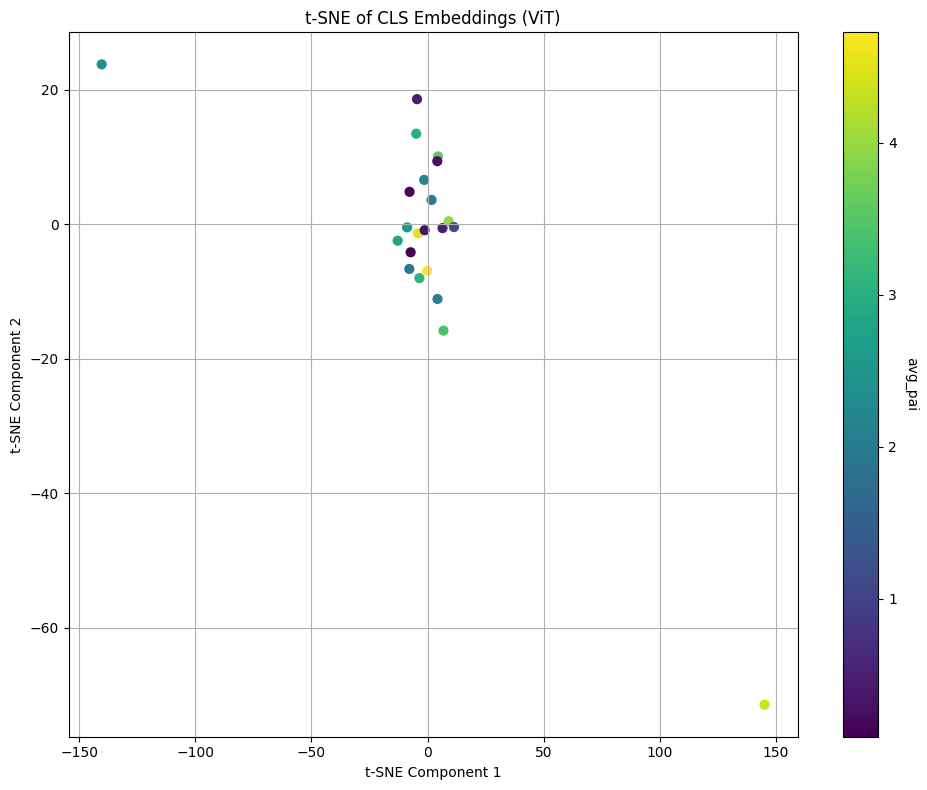

In [14]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import rasterio
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# --- Dataset ---
class S1Dataset(Dataset):
    def __init__(self, data_dir, split, target_df, patch_size=32):
        self.data_dir = data_dir
        self.split = split
        self.patch_size = patch_size
        self.target_df = target_df

        all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"s1_{split}_") and f.endswith(".tif")])
        target_files = set(target_df['filename'])
        self.files = [f for f in all_files if f in target_files]

        print(f"[INFO] {split} dataset initialized with {len(self.files)} tiles")

    def __len__(self):
        return len(self.files)

    def _load_and_fix_patch(self, filepath):
        with rasterio.open(filepath) as src:
            array = src.read(out_dtype='float32')
        tensor = torch.from_numpy(array)

        _, h, w = tensor.shape
        desired = self.patch_size

        if h > desired:
            tensor = tensor[:, :desired, :]
        if w > desired:
            tensor = tensor[:, :, :desired]

        pad_h = max(0, desired - tensor.shape[1])
        pad_w = max(0, desired - tensor.shape[2])
        if pad_h > 0 or pad_w > 0:
            tensor = nn.functional.pad(tensor, (0, pad_w, 0, pad_h), mode='constant', value=0)

        return tensor

    def __getitem__(self, idx):
        filename = self.files[idx]
        filepath = os.path.join(self.data_dir, filename)
        tensor = self._load_and_fix_patch(filepath)

        row = self.target_df[self.target_df['filename'] == filename]
        target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
        target_tensor = torch.tensor(target, dtype=torch.float32)

        return tensor, target_tensor


# --- Simple Vision Transformer ---
class SimpleViT(nn.Module):
    def __init__(self, in_channels=4, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
        super().__init__()
        self.patch_size = patch_size
        self.emb_dim = emb_dim

        self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))

        encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        self.mlp_head = nn.Sequential(
            nn.LayerNorm(emb_dim),
            nn.Linear(emb_dim, 1)
        )

    def forward(self, x):
        B = x.size(0)
        x = self.patch_embed(x)  # [B, emb_dim, H_patch, W_patch]
        x = x.flatten(2).transpose(1, 2)  # [B, seq_len, emb_dim]

        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)

        x = x + self.pos_embed
        x = self.transformer(x)

        cls_out = x[:, 0]
        out = self.mlp_head(cls_out).squeeze(1)
        return out

    def extract_cls_embeddings(self, x):
        B = x.size(0)
        x = self.patch_embed(x)
        x = x.flatten(2).transpose(1, 2)
        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        cls_out = x[:, 0]
        return cls_out


# --- Extract embeddings ---
def extract_embeddings_and_targets(model, dataloader, device):
    model.eval()
    all_embeddings = []
    all_targets = []
    with torch.no_grad():
        for x, y in dataloader:
            x = x.to(device)
            embeddings = model.extract_cls_embeddings(x)
            embeddings = embeddings.detach().cpu()
            all_embeddings.append(embeddings)
            all_targets.append(y)

    embeddings = torch.cat(all_embeddings, dim=0).numpy()
    targets = torch.cat(all_targets, dim=0).numpy()

    # Filter NaNs
    mask = ~np.isnan(embeddings).any(axis=1)
    embeddings = embeddings[mask]
    targets = targets[mask]

    print(f"[INFO] Extracted {embeddings.shape[0]} clean embeddings (NaNs filtered)")
    return embeddings, targets


def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
    assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

    n_samples, n_features = embeddings.shape

    # if use_pca:
    #     try:
    #         n_components = min(50, n_samples, n_features)
    #         print(f"[INFO] Applying PCA: {n_features} → {n_components} components")
    #         pca = PCA(n_components=n_components, random_state=42)
    #         embeddings = pca.fit_transform(embeddings)
    #     except ValueError as e:
    #         print("[ERROR] PCA failed due to shape mismatch.")
    #         raise e

    # Automatically adjust perplexity to be valid
    safe_perplexity = min(perplexity, max(5, n_samples // 3))
    if perplexity != safe_perplexity:
        print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity} (must be < n_samples={n_samples})")

    tsne = TSNE(n_components=10, perplexity=safe_perplexity, random_state=42, method = 'exact')
    reduced = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
    cbar = plt.colorbar(scatter)
    cbar.set_label('avg_pai', rotation=270, labelpad=15)
    plt.title('t-SNE of CLS Embeddings (ViT)')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()



# --- Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# data_dir = "/path/to/eo_folder"  # Replace with your path
# avg_target_df = ...              # Load your dataframe

# Split your target dataframe into train/val/test
train_df = avg_target_df[avg_target_df['filename'].str.contains('_train_')]
val_df = avg_target_df[avg_target_df['filename'].str.contains('_val_')]
test_df = avg_target_df[avg_target_df['filename'].str.contains('_test_')]

train_dataset = S1Dataset(data_dir, 'train', train_df)
val_dataset = S1Dataset(data_dir, 'val', val_df)
test_dataset = S1Dataset(data_dir, 'test', test_df)

batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Model
model = SimpleViT(in_channels=4).to(device)

# Example forward check
imgs, targets = next(iter(train_loader))
print(f"Images batch shape: {imgs.shape}")
print(f"Targets batch shape: {targets.shape}")

# --- Visualize embeddings from validation set ---
embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
visualize_tsne(embeddings, targets)


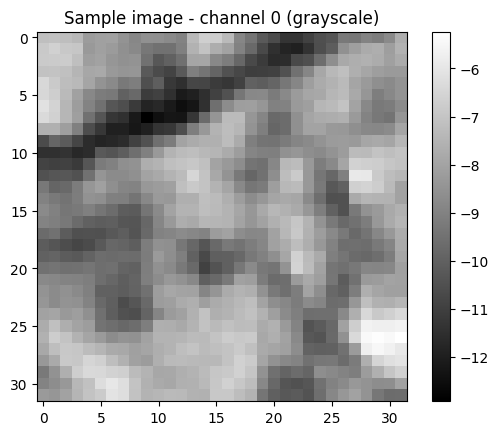

In [15]:
import matplotlib.pyplot as plt

# Grab one batch from your train_loader
images, targets = next(iter(train_loader))

# Visualize first sample, first channel
sample_img = images[0, 0].cpu().numpy()

plt.imshow(sample_img, cmap='gray')
plt.title('Sample image - channel 0 (grayscale)')
plt.colorbar()
plt.show()


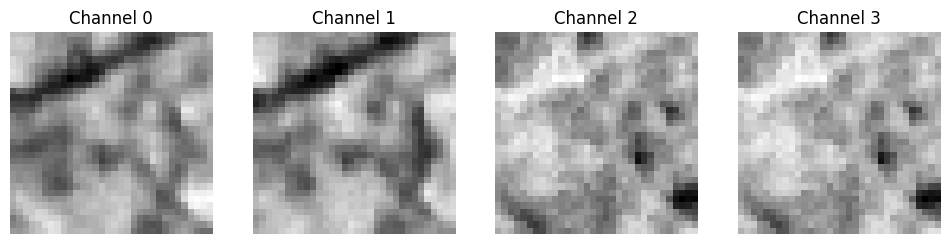

In [16]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3))
for i in range(4):
    axs[i].imshow(images[0, i].cpu().numpy(), cmap='gray')
    axs[i].set_title(f'Channel {i}')
    axs[i].axis('off')
plt.show()


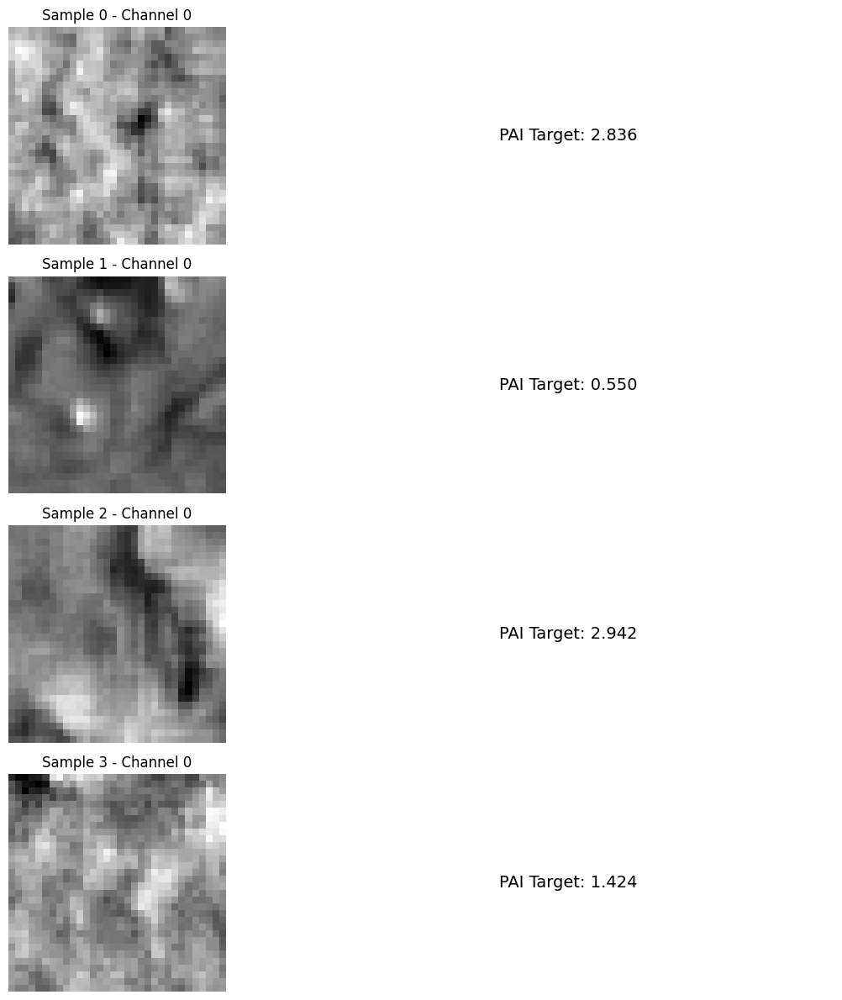

In [17]:
import matplotlib.pyplot as plt

# Get one batch from the DataLoader
images, targets = next(iter(train_loader))

# Number of samples to display (e.g., 4)
num_samples = 4

plt.figure(figsize=(12, 3 * num_samples))

for i in range(num_samples):
    img = images[i].cpu().numpy()  # shape: [C, H, W]
    pai = targets[i].item()

    # If you want to visualize one channel (e.g., first channel of S1)
    img_channel = img[0]  # channel 0, shape [H, W]

    plt.subplot(num_samples, 2, 2*i + 1)
    plt.imshow(img_channel, cmap='gray')
    plt.title(f"Sample {i} - Channel 0")
    plt.axis('off')

    plt.subplot(num_samples, 2, 2*i + 2)
    plt.text(0.5, 0.5, f"PAI Target: {pai:.3f}", fontsize=14, ha='center', va='center')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [18]:
images, targets = next(iter(train_loader))
print(targets)  # should show a tensor of floats, the PAI values


tensor([1.8051, 0.1186, 2.3853, 0.9837, 3.0946, 0.5641, 1.2436, 0.1334])


s1 patch embedding - T-distributed Stochastic Neighbor Embedding. (TSNE)

In [19]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np

def visualize_tsne_3d(embeddings, targets, perplexity=30):
    assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

    n_samples = embeddings.shape[0]

    # Safe perplexity adjustment
    safe_perplexity = min(perplexity, max(5, n_samples // 3))
    if perplexity != safe_perplexity:
        print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity} (must be < n_samples={n_samples})")

    # t-SNE in 3D
    tsne = TSNE(n_components=3, perplexity=safe_perplexity, random_state=42)
    reduced = tsne.fit_transform(embeddings)

    # 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(reduced[:, 0], reduced[:, 1], reduced[:, 2], c=targets, cmap='viridis', s=60)
    ax.set_xlabel("t-SNE Component 1")
    ax.set_ylabel("t-SNE Component 2")
    ax.set_zlabel("t-SNE Component 3")
    plt.title("3D t-SNE of CLS Embeddings (ViT)")
    cbar = plt.colorbar(sc, ax=ax, pad=0.1)
    cbar.set_label('avg_pai', rotation=270, labelpad=15)
    plt.tight_layout()
    plt.show()


[INFO] Extracted 22 clean embeddings (NaNs filtered)
[INFO] Adjusting t-SNE perplexity from 30 to 7 (must be < n_samples=22)


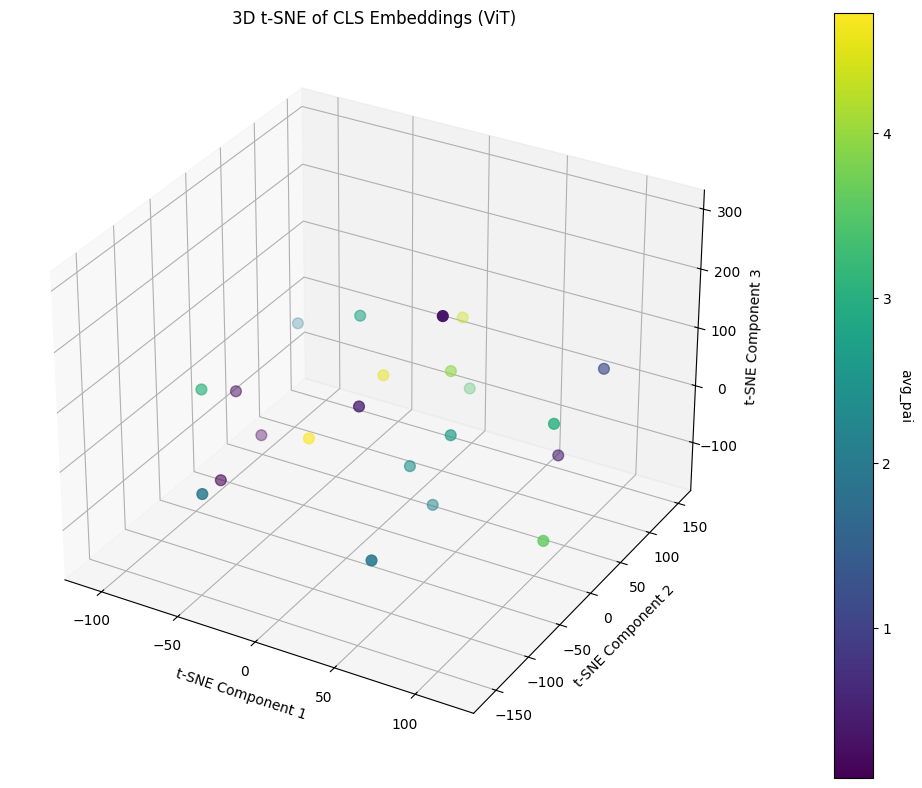

In [20]:
embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
visualize_tsne_3d(embeddings, targets)


# DEM branch

[INFO] train DEM dataset initialized with 104 tiles
[INFO] val DEM dataset initialized with 25 tiles
[INFO] test DEM dataset initialized with 22 tiles
Images batch shape: torch.Size([8, 2, 32, 32])
Targets batch shape: torch.Size([8])
[INFO] Extracted 8 clean embeddings (NaNs filtered)
[INFO] Adjusting t-SNE perplexity from 30 to 5


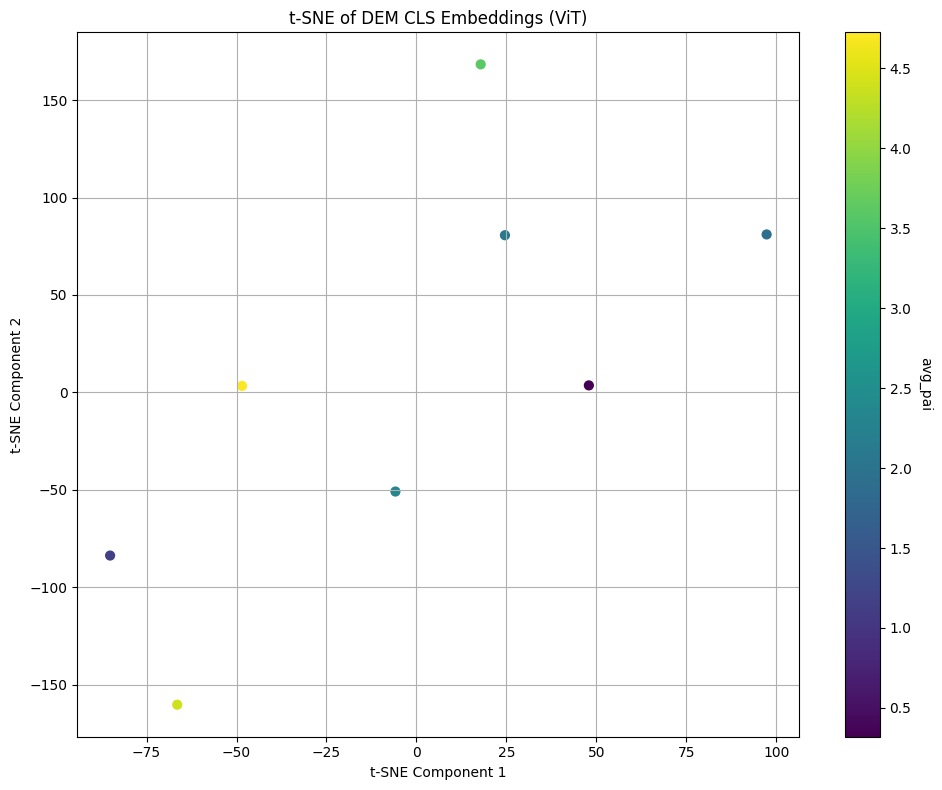

In [30]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE
# from sklearn.decomposition import PCA
# import random

# # --- DEM Dataset (2-band tiles) ---
# class DEMDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"dem_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} DEM dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_fix_patch(self, filepath):
#       with rasterio.open(filepath) as src:
#           array = src.read(out_dtype='float32')  # shape: [C, H, W]
#       tensor = torch.from_numpy(array)

#       _, h, w = tensor.shape
#       desired = self.patch_size

#       # Crop if needed
#       tensor = tensor[:, :desired, :desired]

#       # Calculate symmetric padding
#       pad_h = max(0, desired - tensor.shape[1])
#       pad_w = max(0, desired - tensor.shape[2])

#       pad_top = pad_h // 2
#       pad_bottom = pad_h - pad_top
#       pad_left = pad_w // 2
#       pad_right = pad_w - pad_left

#       tensor = nn.functional.pad(
#           tensor,
#           (pad_left, pad_right, pad_top, pad_bottom),  # (left, right, top, bottom)
#           mode='constant',
#           value=0
#       )

#       return tensor

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_fix_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor

import os
import torch
from torch.utils.data import Dataset, DataLoader
import rasterio
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# --- DEM Dataset ---
class DEMDataset(Dataset):
    def __init__(self, data_dir, split, target_df, patch_size=32):
        self.data_dir = data_dir
        self.split = split
        self.patch_size = patch_size
        self.target_df = target_df

        all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"dem_{split}_") and f.endswith(".tif")])
        target_files = set(target_df['filename'])
        self.files = [f for f in all_files if f in target_files]

        print(f"[INFO] {split} DEM dataset initialized with {len(self.files)} tiles")

    def __len__(self):
        return len(self.files)

    def _load_and_resize_patch(self, filepath):
        with rasterio.open(filepath) as src:
            array = src.read(out_dtype='float32')  # [C, H, W]
            # Resample to patch_size x patch_size using bilinear interpolation
            array_resized = src.read(
                out_shape=(src.count, self.patch_size, self.patch_size),
                resampling=rasterio.enums.Resampling.bilinear
            )

        tensor = torch.from_numpy(array_resized)
        return tensor  # shape [C, patch_size, patch_size]

    def __getitem__(self, idx):
        filename = self.files[idx]
        filepath = os.path.join(self.data_dir, filename)
        tensor = self._load_and_resize_patch(filepath)

        row = self.target_df[self.target_df['filename'] == filename]
        target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
        target_tensor = torch.tensor(target, dtype=torch.float32)

        return tensor, target_tensor



# --- ViT for DEM (2-band input) ---
class DEMViT(nn.Module):
    def __init__(self, in_channels=2, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
        super().__init__()
        self.patch_size = patch_size
        self.emb_dim = emb_dim

        self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))

        encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        self.mlp_head = nn.Sequential(
            nn.LayerNorm(emb_dim),
            nn.Linear(emb_dim, 1)
        )

    def forward(self, x):
        B = x.size(0)
        x = self.patch_embed(x)  # [B, emb_dim, H_patch, W_patch]
        x = x.flatten(2).transpose(1, 2)  # [B, seq_len, emb_dim]

        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)

        x = x + self.pos_embed
        x = self.transformer(x)

        cls_out = x[:, 0]
        out = self.mlp_head(cls_out).squeeze(1)
        return out

    def extract_cls_embeddings(self, x):
        B = x.size(0)
        x = self.patch_embed(x)
        x = x.flatten(2).transpose(1, 2)
        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        return x[:, 0]

# --- Embedding extraction ---
def extract_embeddings_and_targets(model, dataloader, device):
    model.eval()
    all_embeddings = []
    all_targets = []
    with torch.no_grad():
        for x, y in dataloader:
            x = x.to(device)
            embeddings = model.extract_cls_embeddings(x)
            embeddings = embeddings.detach().cpu()
            all_embeddings.append(embeddings)
            all_targets.append(y)

    embeddings = torch.cat(all_embeddings, dim=0).numpy()
    targets = torch.cat(all_targets, dim=0).numpy()

    mask = ~np.isnan(embeddings).any(axis=1)
    embeddings = embeddings[mask]
    targets = targets[mask]

    print(f"[INFO] Extracted {embeddings.shape[0]} clean embeddings (NaNs filtered)")
    return embeddings, targets

# --- t-SNE visualization ---
def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
    assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

    n_samples, n_features = embeddings.shape
    safe_perplexity = min(perplexity, max(5, n_samples // 3))
    if perplexity != safe_perplexity:
        print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity}")

    tsne = TSNE(n_components=2, perplexity=safe_perplexity, random_state=42, method='exact')
    reduced = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
    cbar = plt.colorbar(scatter)
    cbar.set_label('avg_pai', rotation=270, labelpad=15)
    plt.title('t-SNE of DEM CLS Embeddings (ViT)')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --- Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Split DataFrame
train_df = avg_target_df[avg_target_df['filename'].str.contains('_train_')]
val_df = avg_target_df[avg_target_df['filename'].str.contains('_val_')]
test_df = avg_target_df[avg_target_df['filename'].str.contains('_test_')]

# Datasets and Loaders
train_dataset = DEMDataset(data_dir, 'train', train_df)
val_dataset = DEMDataset(data_dir, 'val', val_df)
test_dataset = DEMDataset(data_dir, 'test', test_df)

batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Model
model = DEMViT(in_channels=2).to(device)

# Check shape
imgs, targets = next(iter(train_loader))
print(f"Images batch shape: {imgs.shape}")
print(f"Targets batch shape: {targets.shape}")

# Visualize embeddings
embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
visualize_tsne(embeddings, targets)


In [31]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np

def visualize_tsne_3d(embeddings, targets, perplexity=30):
    assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

    n_samples = embeddings.shape[0]

    # Safe perplexity adjustment
    safe_perplexity = min(perplexity, max(5, n_samples // 3))
    if perplexity != safe_perplexity:
        print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity} (must be < n_samples={n_samples})")

    # t-SNE in 3D
    tsne = TSNE(n_components=3, perplexity=safe_perplexity, random_state=42)
    reduced = tsne.fit_transform(embeddings)

    # 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(reduced[:, 0], reduced[:, 1], reduced[:, 2], c=targets, cmap='viridis', s=60)
    ax.set_xlabel("t-SNE Component 1")
    ax.set_ylabel("t-SNE Component 2")
    ax.set_zlabel("t-SNE Component 3")
    plt.title("3D t-SNE of CLS Embeddings (ViT)")
    cbar = plt.colorbar(sc, ax=ax, pad=0.1)
    cbar.set_label('avg_pai', rotation=270, labelpad=15)
    plt.tight_layout()
    plt.show()


[INFO] Extracted 8 clean embeddings (NaNs filtered)
[INFO] Adjusting t-SNE perplexity from 30 to 5 (must be < n_samples=8)


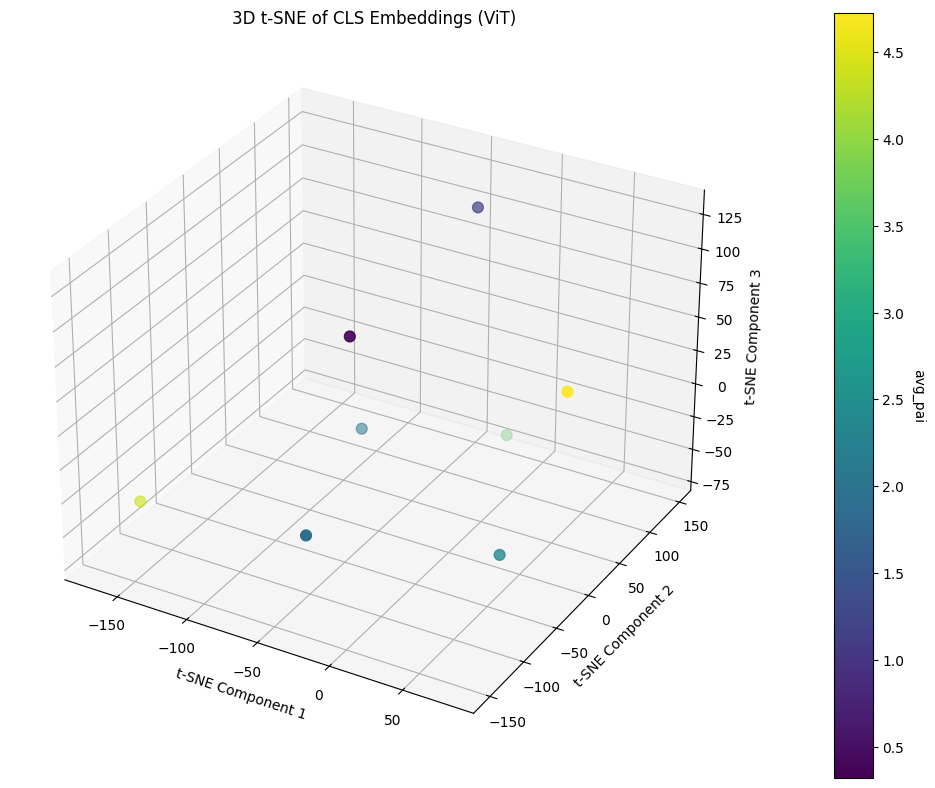

In [32]:
embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
visualize_tsne_3d(embeddings, targets)


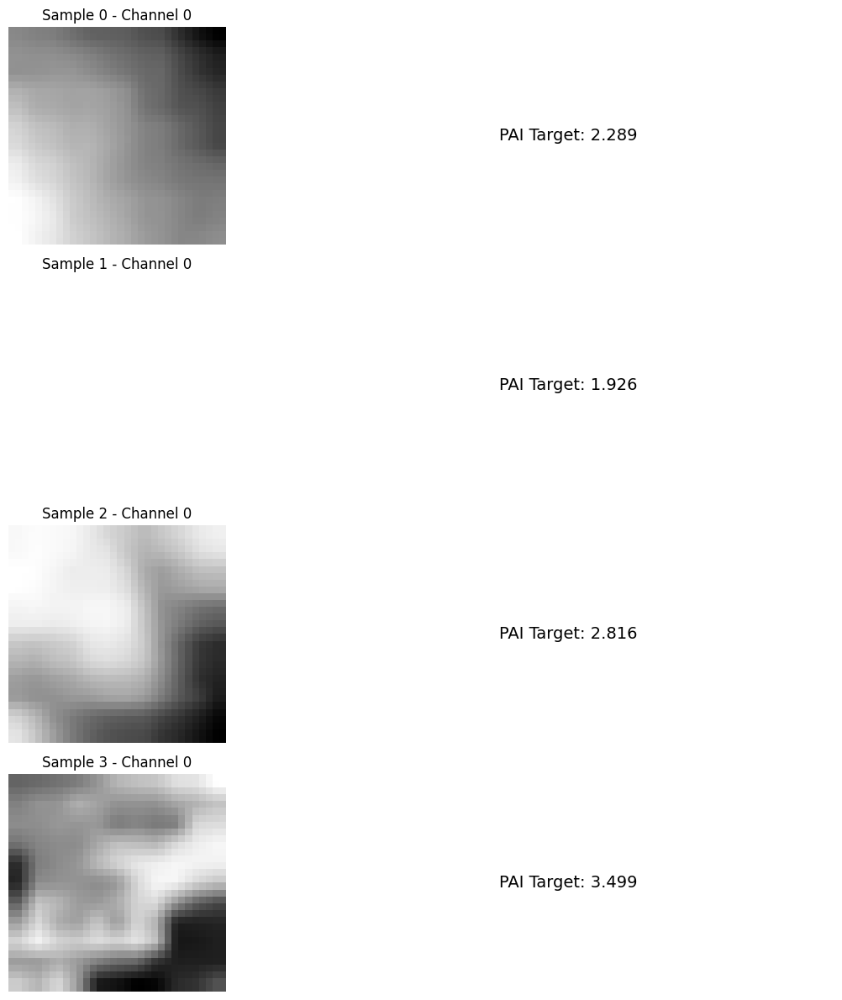

In [47]:
import matplotlib.pyplot as plt

# Get one batch from the DataLoader
images, targets = next(iter(train_loader))

# Number of samples to display (e.g., 4)
num_samples = 4

plt.figure(figsize=(12, 3 * num_samples))

for i in range(num_samples):
    img = images[i].cpu().numpy()  # shape: [C, H, W]
    pai = targets[i].item()

    # If you want to visualize one channel (e.g., first channel of S1)
    img_channel = img[0]  # channel 0, shape [H, W]

    plt.subplot(num_samples, 2, 2*i + 1)
    plt.imshow(img_channel, cmap='gray')
    plt.title(f"Sample {i} - Channel 0")
    plt.axis('off')

    plt.subplot(num_samples, 2, 2*i + 2)
    plt.text(0.5, 0.5, f"PAI Target: {pai:.3f}", fontsize=14, ha='center', va='center')
    plt.axis('off')

plt.tight_layout()
plt.show()


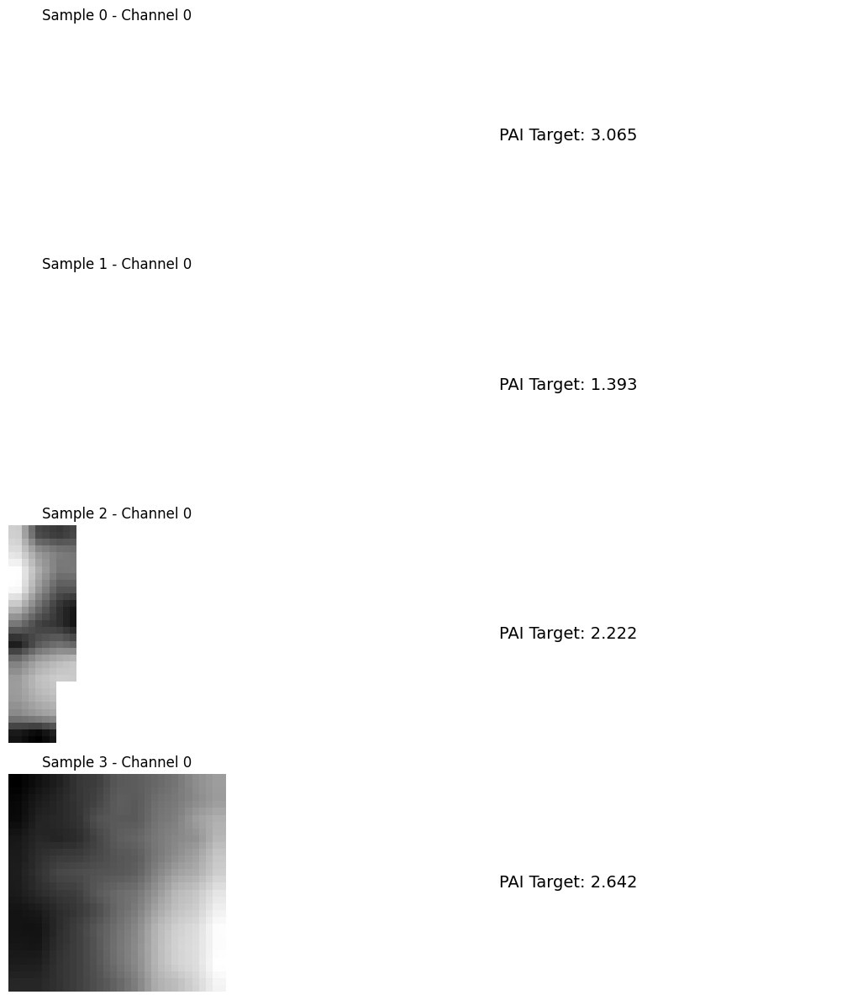

In [48]:
import matplotlib.pyplot as plt

# Get one batch from the DataLoader
images, targets = next(iter(train_loader))

# Number of samples to display (e.g., 4)
num_samples = 4

plt.figure(figsize=(12, 3 * num_samples))

for i in range(num_samples):
    img = images[i].cpu().numpy()  # shape: [C, H, W]
    pai = targets[i].item()

    # If you want to visualize one channel (e.g., first channel of S1)
    img_channel = img[0]  # channel 0, shape [H, W]

    plt.subplot(num_samples, 2, 2*i + 1)
    plt.imshow(img_channel, cmap='gray')
    plt.title(f"Sample {i} - Channel 0")
    plt.axis('off')

    plt.subplot(num_samples, 2, 2*i + 2)
    plt.text(0.5, 0.5, f"PAI Target: {pai:.3f}", fontsize=14, ha='center', va='center')
    plt.axis('off')

plt.tight_layout()
plt.show()

[[596.2723  596.2741  596.2849  ... 599.33044 598.1999  598.0115 ]
 [596.2745  596.27606 596.28546 ... 599.32605 598.1983  598.0104 ]
 [596.323   596.3193  596.2972  ... 599.2288  598.16315 597.9855 ]
 ...
 [585.99445 585.86    585.05316 ... 596.48975 596.3024  596.27124]
 [584.99524 584.8436  583.9339  ... 595.89594 595.5579  595.5016 ]
 [584.9498  584.7974  583.883   ... 595.86896 595.5241  595.4666 ]]


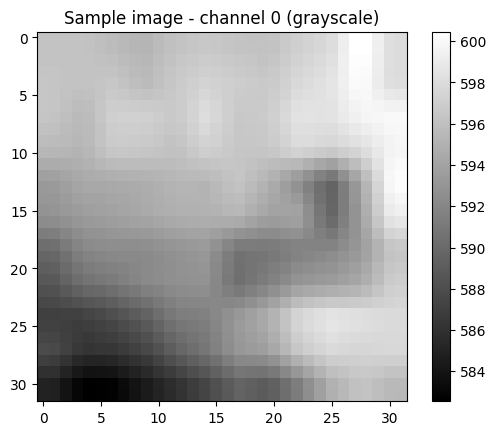

In [49]:
import matplotlib.pyplot as plt

# Grab one batch from your train_loader
images, targets = next(iter(train_loader))

# Visualize first sample, first channel
sample_img = images[0, 0].cpu().numpy()

print(sample_img)

plt.imshow(sample_img, cmap='gray')
plt.title('Sample image - channel 0 (grayscale)')
plt.colorbar()
plt.show()

In [50]:
def check_loader_for_empty_tiles(dataloader, max_batches=10, zero_threshold=0.99):
    print("[INFO] Scanning data for low-content or empty patches...")
    for batch_idx, (images, targets) in enumerate(dataloader):
        if batch_idx >= max_batches:
            break
        images_np = images.cpu().numpy()
        for i in range(images_np.shape[0]):
            patch = images_np[i]
            # Check if too much of the patch is zero
            zero_ratio = np.mean(patch == 0)
            if zero_ratio > zero_threshold:
                print(f"[WARNING] Batch {batch_idx}, Sample {i}: {zero_ratio*100:.1f}% zeros")
            elif np.isnan(patch).any():
                print(f"[WARNING] Batch {batch_idx}, Sample {i}: Contains NaNs")
    print("[INFO] Scan complete.\n")


check_loader_for_empty_tiles(train_loader, max_batches=20, zero_threshold=0.95)


[INFO] Scanning data for low-content or empty patches...
[WARNING] Batch 0, Sample 1: Contains NaNs
[WARNING] Batch 0, Sample 2: Contains NaNs
[WARNING] Batch 0, Sample 3: Contains NaNs
[WARNING] Batch 0, Sample 5: Contains NaNs
[WARNING] Batch 0, Sample 7: Contains NaNs
[WARNING] Batch 1, Sample 0: Contains NaNs
[WARNING] Batch 1, Sample 1: Contains NaNs
[WARNING] Batch 1, Sample 2: Contains NaNs
[WARNING] Batch 1, Sample 3: Contains NaNs
[WARNING] Batch 1, Sample 4: Contains NaNs
[WARNING] Batch 1, Sample 5: Contains NaNs
[WARNING] Batch 1, Sample 6: Contains NaNs
[WARNING] Batch 2, Sample 0: Contains NaNs
[WARNING] Batch 2, Sample 1: Contains NaNs
[WARNING] Batch 2, Sample 2: Contains NaNs
[WARNING] Batch 2, Sample 3: Contains NaNs
[WARNING] Batch 2, Sample 4: Contains NaNs
[WARNING] Batch 2, Sample 6: Contains NaNs
[WARNING] Batch 2, Sample 7: Contains NaNs
[WARNING] Batch 3, Sample 1: Contains NaNs
[WARNING] Batch 3, Sample 2: Contains NaNs
[WARNING] Batch 3, Sample 3: Contains Na

In [51]:
def print_patch_stats(dataloader, num_batches=5):
    all_vals = []
    for i, (images, _) in enumerate(dataloader):
        if i >= num_batches:
            break
        all_vals.append(images.cpu().numpy().flatten())
    all_vals = np.concatenate(all_vals)
    print(f"Mean: {np.mean(all_vals):.3f}, Std: {np.std(all_vals):.3f}")
    print(f"Min: {np.min(all_vals):.3f}, Max: {np.max(all_vals):.3f}")
    print(f"Zero Ratio: {np.mean(all_vals == 0):.3f}")
    print(f"NaN Count: {np.isnan(all_vals).sum()}")


https://chatgpt.com/c/687697b4-1aa0-8005-afa4-c4c7ecc40920